### ANÁLISIS EXPLORATORIO DE DATOS (EDA)

### Preprocesamiento de datos

In [1]:
import pandas as pd
jmq=pd.read_csv('bd.csv') # se está cargando la base de datos

In [21]:
jmq.head()  # si colocas tail te muestra las ultimas filas

,X,Y,Z,Fe,Si,P,Al,Mn,Rocktype
0,-7400.22,1496.58,1457.62,46.478,31.620,0.017,1.139,0.01,7
1,-7400.22,1496.58,1450.37,40.578,40.838,0.028,0.711,0.01,7
2,-7400.22,1496.58,1427.72,40.488,40.655,0.012,0.914,0.01,6
3,-7400.22,1496.58,1421.62,40.488,40.655,0.012,0.914,0.01,6
4,-7400.22,1496.58,1415.52,43.969,35.776,0.017,0.854,0.01,7


In [22]:
jmq.tail()

,X,Y,Z,Fe,Si,P,Al,Mn,Rocktype
4462,-5532.36,1343.19,1397.30,49.723,22.790,0.120,1.086,0.170,4
4463,-5532.36,1343.19,1389.10,45.793,28.937,0.103,1.289,0.076,7
4464,-5532.36,1343.19,1381.65,45.793,28.937,0.103,1.289,0.076,7
4465,-7401.00,1839.15,1429.20,62.256,1.134,0.104,2.369,0.040,3
4466,-7401.00,1842.15,1424.01,60.391,4.885,0.071,2.970,0.042,9


#### Duplicados

In [23]:
# Ver cuántas filas duplicadas hay (todas las columnas iguales)
duplicados = jmq.duplicated().sum()
print(f"Total de filas duplicadas: {duplicados}")

# Mostrar las filas que están duplicadas
duplicadas = jmq[jmq.duplicated()]
print(duplicadas)



Total de filas duplicadas: 2
           X        Y        Z      Fe     Si      P     Al     Mn  Rocktype
4465 -7401.0  1839.15  1429.20  62.256  1.134  0.104  2.369  0.040         3
4466 -7401.0  1842.15  1424.01  60.391  4.885  0.071  2.970  0.042         9


In [24]:
# Eliminar duplicados y actualizar el DataFrame
jmq = jmq.drop_duplicates()

# Verificar que ya no hay duplicados
print("Duplicados después de limpieza:", jmq.duplicated().sum())


Duplicados después de limpieza: 0


#### Valores ausentes

In [25]:
# Contar los valores ausentes por columna
valores_nulos = jmq.isnull().sum()
print(valores_nulos)

X           0
Y           0
Z           0
Fe          0
Si          1
P           1
Al          1
Mn          0
Rocktype    0
dtype: int64


In [26]:
# Rellenar valores nulos con la media de cada columna
jmq['Si'] = jmq['Si'].fillna(jmq['Si'].mean())
jmq['P'] = jmq['P'].fillna(jmq['P'].mean())
jmq['Al'] = jmq['Al'].fillna(jmq['Al'].mean())

In [27]:
# Confirmar que ya no hay nulos
print(jmq.isnull().sum())


X           0
Y           0
Z           0
Fe          0
Si          0
P           0
Al          0
Mn          0
Rocktype    0
dtype: int64


#### Outliers

In [28]:
# Función para detectar outliers con IQR
def detectar_outliers(col):
    Q1 = jmq[col].quantile(0.25)
    Q3 = jmq[col].quantile(0.75)
    IQR = Q3 - Q1
    lim_inf = Q1 - 1.5 * IQR
    lim_sup = Q3 + 1.5 * IQR
    outliers = jmq[(jmq[col] < lim_inf) | (jmq[col] > lim_sup)]
    return outliers

# Ver cuántos outliers hay por variable
for var in ['X', 'Y', 'Z', 'Fe', 'Si', 'P', 'Al', 'Mn', 'Rocktype']:
    outliers = detectar_outliers(var)
    print(f"{var}: {len(outliers)} outliers detectados")


X: 0 outliers detectados
Y: 32 outliers detectados
Z: 130 outliers detectados
Fe: 3 outliers detectados
Si: 0 outliers detectados
P: 172 outliers detectados
Al: 249 outliers detectados
Mn: 687 outliers detectados
Rocktype: 138 outliers detectados


### Estadística descriptiva

#### Estadísticas básicas

In [29]:
jmq.describe().T

,count,mean,std,min,25%,50%,75%,max
X,4465.0,-6414.106555,538.592179,-7501.240,-6799.990,-6355.430,-6000.000,-5386.290
Y,4465.0,1389.045915,190.784684,902.280,1258.650,1384.080,1505.950,1937.520
Z,4465.0,1321.815646,85.872537,1025.580,1276.280,1335.100,1379.050,1517.900
Fe,4465.0,51.754908,11.572933,9.916,42.406,52.934,62.252,69.701
Si,4465.0,21.789504,17.413653,0.216,4.315,20.248,36.515,77.045
P,4465.0,0.054782,0.041048,0.007,0.027,0.044,0.071,0.530
Al,4465.0,1.309058,1.289018,0.100,0.457,0.913,1.712,12.599
Mn,4465.0,0.300489,1.391735,0.008,0.014,0.031,0.086,32.057
Rocktype,4465.0,2.484434,18.297026,-99.000,3.000,7.000,7.000,10.000


#### Histogramas

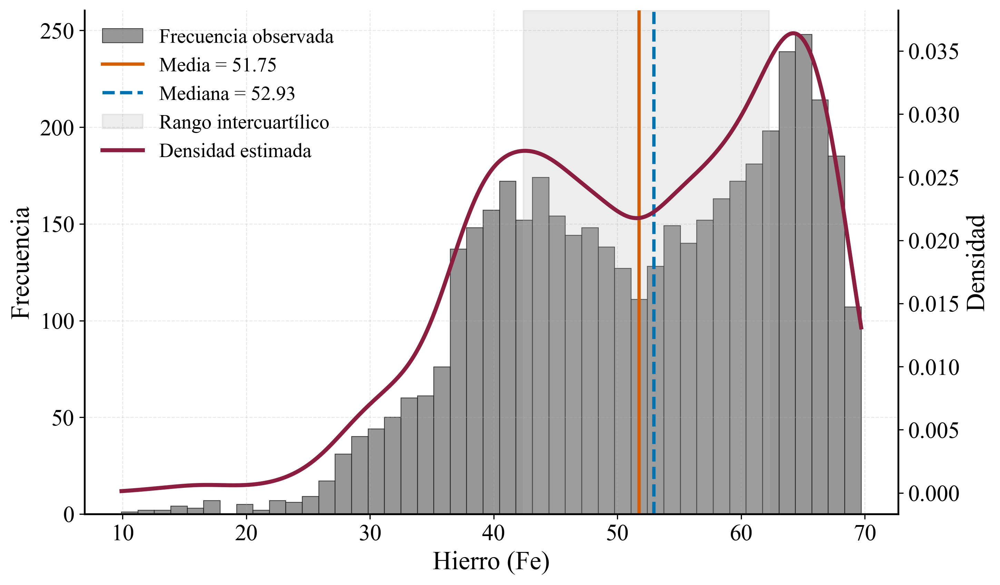

In [33]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# ============================
# Datos
# ============================
data = jmq['Fe'].dropna()

media = data.mean()
mediana = data.median()
p25 = data.quantile(0.25)
p75 = data.quantile(0.75)

# Curva de densidad KDE
x_grid = np.linspace(data.min(), data.max(), 500)
kde = gaussian_kde(data)
kde_values = kde(x_grid)

# ============================
# Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
    'axes.linewidth': 1.25
})

fig, ax1 = plt.subplots(figsize=(10, 6), dpi=300)

# ============================
# Histograma
# ============================
counts, bins, patches = ax1.hist(
    data,
    bins=45,
    color='grey',
    edgecolor='#1F1F1F',
    linewidth=0.55,
    alpha=0.82,
    label='Frecuencia observada'
)

ax1.set_xlabel('Hierro (Fe)')
ax1.set_ylabel('Frecuencia')

# ============================
# Segundo eje para densidad
# ============================
ax2 = ax1.twinx()

ax2.plot(
    x_grid,
    kde_values,
    color='#8B1E3F',
    linewidth=2.8,
    label='Densidad estimada'
)

ax2.set_ylabel('Densidad')

# ============================
# Media, mediana y rango intercuartílico
# ============================
ax1.axvline(
    media,
    color='#D55E00',
    linestyle='-',
    linewidth=2.3,
    label=f'Media = {media:.2f} '
)

ax1.axvline(
    mediana,
    color='#0072B2',
    linestyle='--',
    linewidth=2.3,
    label=f'Mediana = {mediana:.2f} '
)

ax1.axvspan(
    p25,
    p75,
    color='#B0B0B0',
    alpha=0.22,
    label='Rango intercuartílico'
)

# ============================
# Estética final
# ============================
ax1.grid(
    True,
    linestyle='--',
    linewidth=0.6,
    alpha=0.30
)

ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)

# Unir leyendas de ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

ax1.legend(
    lines1 + lines2,
    labels1 + labels2,
    frameon=False,
    loc='upper left'
)

plt.tight_layout()

plt.savefig(
    "histograma_Fe_profesional_Q1.png",
    dpi=800,
    bbox_inches="tight"
)  

# Guardar figura en alta calidad
#plt.savefig(
    #'histograma_UCS_profesional_Q1.png',
   # dpi=800,
    #bbox_inches='tight'
#

plt.show()

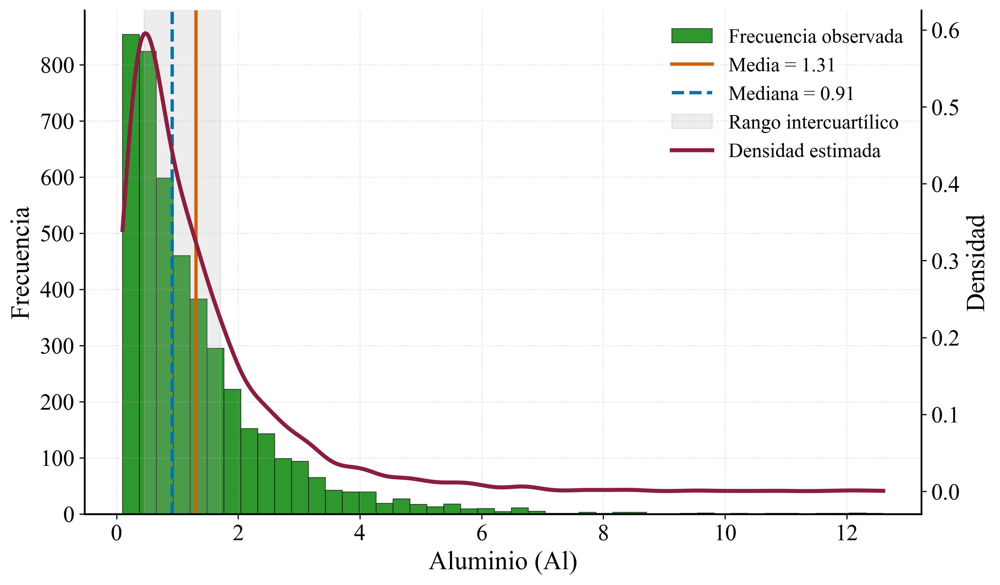

In [36]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# ============================
# Datos
# ============================
data = jmq['Al'].dropna()

media = data.mean()
mediana = data.median()
p25 = data.quantile(0.25)
p75 = data.quantile(0.75)

# Curva de densidad KDE
x_grid = np.linspace(data.min(), data.max(), 500)
kde = gaussian_kde(data)
kde_values = kde(x_grid)

# ============================
# Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'legend.fontsize': 14,
    'axes.linewidth': 1.25
})

fig, ax1 = plt.subplots(figsize=(10, 6), dpi=300)

# ============================
# Histograma
# ============================
counts, bins, patches = ax1.hist(
    data,
    bins=45,
    color='green',
    edgecolor='#1F1F1F',
    linewidth=0.55,
    alpha=0.82,
    label='Frecuencia observada'
)

ax1.set_xlabel('Aluminio (Al)')
ax1.set_ylabel('Frecuencia')

# ============================
# Segundo eje para densidad
# ============================
ax2 = ax1.twinx()

ax2.plot(
    x_grid,
    kde_values,
    color='#8B1E3F',
    linewidth=2.8,
    label='Densidad estimada'
)

ax2.set_ylabel('Densidad')

# ============================
# Media, mediana y rango intercuartílico
# ============================
ax1.axvline(
    media,
    color='#D55E00',
    linestyle='-',
    linewidth=2.3,
    label=f'Media = {media:.2f} '
)

ax1.axvline(
    mediana,
    color='#0072B2',
    linestyle='--',
    linewidth=2.3,
    label=f'Mediana = {mediana:.2f} '
)

ax1.axvspan(
    p25,
    p75,
    color='#B0B0B0',
    alpha=0.22,
    label='Rango intercuartílico'
)

# ============================
# Estética final
# ============================
ax1.grid(
    True,
    linestyle='--',
    linewidth=0.6,
    alpha=0.30
)

ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)

ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)

# Unir leyendas de ambos ejes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()

ax1.legend(
    lines1 + lines2,
    labels1 + labels2,
    frameon=False,
    loc='upper right'
)

plt.tight_layout()

#Guardar figura en alta calidad

plt.savefig(
    "histograma_Al_profesional_Q1.png",
    dpi=800,
    bbox_inches="tight"
)  


plt.show()

#### Boxplot 

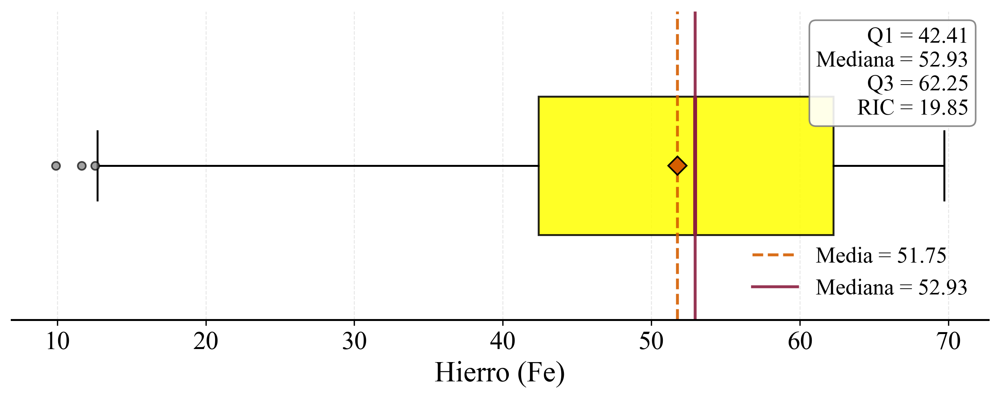

In [38]:
import matplotlib.pyplot as plt
import numpy as np

# ============================
# Datos
# ============================
data = jmq['Fe'].dropna()

media = data.mean()
mediana = data.median()
q1 = data.quantile(0.25)
q3 = data.quantile(0.75)
iqr = q3 - q1

# ============================
# Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'axes.linewidth': 1.2
})

fig, ax = plt.subplots(figsize=(9, 3.8), dpi=300)

# ============================
# Boxplot
# ============================
bp = ax.boxplot(
    data,
    vert=False,
    patch_artist=True,
    widths=0.45,
    showmeans=True,
    boxprops=dict(facecolor='yellow', edgecolor='black', linewidth=1.2, alpha=0.85),
    whiskerprops=dict(color='black', linewidth=1.2),
    capprops=dict(color='black', linewidth=1.2),
    medianprops=dict(color='#8B1E3F', linewidth=2.4),
    meanprops=dict(marker='D', markerfacecolor='#D55E00', markeredgecolor='black', markersize=8),
    flierprops=dict(marker='o', markerfacecolor='#7A7A7A', markeredgecolor='black', markersize=5, alpha=0.7)
)

# ============================
# Etiquetas
# ============================
ax.set_xlabel('Hierro (Fe)')
ax.set_yticks([])

# ============================
# Líneas de referencia opcionales
# ============================
ax.axvline(media, color='#D55E00', linestyle='--', linewidth=1.8, alpha=0.9, label=f'Media = {media:.2f}')
ax.axvline(mediana, color='#8B1E3F', linestyle='-', linewidth=1.8, alpha=0.9, label=f'Mediana = {mediana:.2f}')

# ============================
# Cuadro resumen estadístico
# ============================
texto = (
    f'Q1 = {q1:.2f}\n'
    f'Mediana = {mediana:.2f}\n'
    f'Q3 = {q3:.2f}\n'
    f'RIC = {iqr:.2f}'
)

ax.text(
    0.98, 0.95, texto,
    transform=ax.transAxes,
    ha='right', va='top',
    fontsize=14,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

# ============================
# Estética final
# ============================
ax.grid(True, axis='x', linestyle='--', linewidth=0.6, alpha=0.30)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

ax.legend(frameon=False, loc='lower right', fontsize=14)

plt.tight_layout()

plt.savefig('boxplot_Fe_profesional_Q1.png', dpi=800, bbox_inches='tight')
#plt.savefig('boxplot_FP_profesional_Q1.png', dpi=800, bbox_inches='tight')
plt.show()

#### Violin plot

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ============================
# 1. Datos
# ============================
data = jmq[['Fe']].dropna().copy()

# ============================
# 2. Cálculo de umbrales por terciles
# ============================
T1 = data['Fe'].quantile(1/3)   # primer tercil: 33.3%
T2 = data['Fe'].quantile(2/3)   # segundo tercil: 66.7%

print(f"Primer tercil  T1 = {T1:.2f} cm")
print(f"Segundo tercil T2 = {T2:.2f} cm")

# ============================
# 3. Clasificación entendible de X50
# ============================
def clasificar_x50(x):
    if x <= T1:
        return f'Ley baja\nX50 ≤ {T1:.2f} '
    elif x <= T2:
        return f'Ley media\n{T1:.2f} < X50 ≤ {T2:.2f} '
    else:
        return f'Ley alta\nX50 > {T2:.2f} '

data['Clase_X50'] = data['Fe'].apply(clasificar_x50)

# Ver cantidad de datos por clase
print("\nCantidad de datos por clase:")
print(data['Clase_X50'].value_counts())

Primer tercil  T1 = 45.43 cm
Segundo tercil T2 = 59.53 cm

Cantidad de datos por clase:
Clase_X50
Ley baja\nX50 ≤ 45.43              1489
Ley media\n45.43 < X50 ≤ 59.53     1488
Ley alta\nX50 > 59.53              1488
Name: count, dtype: int64


In [44]:
orden=[
    f'Ley baja\nX50 ≤ {T1:.2f} ',
    f'Ley media\n{T1:.2f} < X50 ≤ {T2:.2f} ',
    f'Ley alta\nX50 > {T2:.2f} '
]

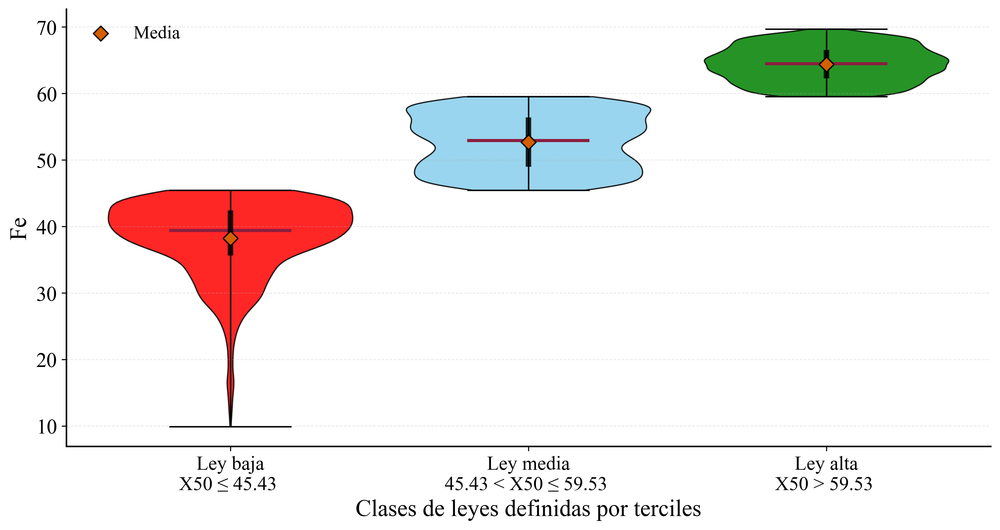

In [46]:
# ============================
# 4. Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 15,
    'ytick.labelsize': 16,
    'axes.linewidth': 1.2
})


grupos = [
    data.loc[data['Clase_X50'] == clase, 'Fe'].values
    for clase in orden
]

# ============================
# 5. Figura
# ============================
fig, ax = plt.subplots(figsize=(11, 6), dpi=300)

vp = ax.violinplot(
    grupos,
    showmeans=False,
    showmedians=True,
    showextrema=True,
    widths=0.82
)

# Colores profesionales
colores = ['red', 'skyblue', 'green']

for i, body in enumerate(vp['bodies']):
    body.set_facecolor(colores[i])
    body.set_edgecolor('black')
    body.set_linewidth(1.0)
    body.set_alpha(0.85)

# Mediana
vp['cmedians'].set_color('#8B1E3F')
vp['cmedians'].set_linewidth(2.4)

# Extremos
for key in ['cbars', 'cmins', 'cmaxes']:
    vp[key].set_color('black')
    vp[key].set_linewidth(1.1)

# ============================
# 6. Agregar rango intercuartílico y media
# ============================
for i, grupo in enumerate(grupos, start=1):
    q1, mediana, q3 = np.percentile(grupo, [25, 50, 75])
    media = np.mean(grupo)

    # Rango intercuartílico
    ax.vlines(i, q1, q3, color='black', linewidth=4.2, alpha=0.85)

    # Media
    ax.scatter(
        i, media,
        color='#D55E00',
        edgecolor='black',
        s=65,
        marker='D',
        zorder=3,
        label='Media' if i == 1 else ""
    )

# ============================
# 7. Etiquetas y estética final
# ============================
ax.set_xticks([1, 2, 3])
ax.set_xticklabels(orden)

ax.set_xlabel('Clases de leyes definidas por terciles')
ax.set_ylabel('Fe')

ax.grid(True, axis='y', linestyle='--', linewidth=0.6, alpha=0.30)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(frameon=False, loc='upper left', fontsize=14)

plt.tight_layout()
plt.savefig('violinplot_Fe_umbrales_terciles_Q1.png', dpi=800, bbox_inches='tight')

#plt.savefig('violinplot_X50_umbrales_terciles_Q1.png', dpi=800, bbox_inches='tight')
plt.show()

#### Gráfico de probabilidad

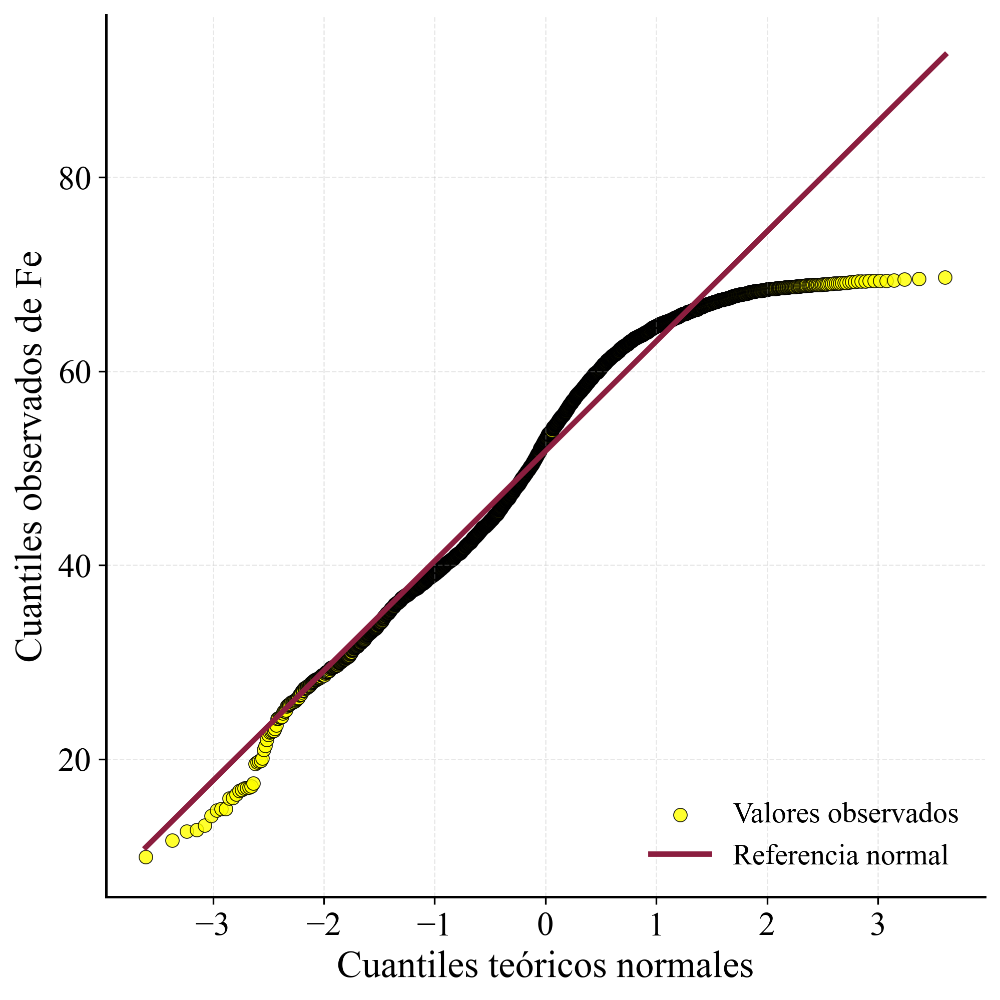

In [48]:
import scipy.stats as stats
import matplotlib.pyplot as plt
import numpy as np

# ============================
# 1. Selección de variable
# ============================
variable = 'Fe'
data = jmq[variable].dropna()

# ============================
# 2. Cálculo del gráfico Q-Q
# ============================
(osm, osr), (slope, intercept, r) = stats.probplot(data, dist="norm")

# ============================
# 3. Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'axes.linewidth': 1.2
})

fig, ax = plt.subplots(figsize=(7, 7), dpi=300)

# ============================
# 4. Puntos observados
# ============================
ax.scatter(
    osm,
    osr,
    s=42,
    color='yellow',
    edgecolor='black',
    linewidth=0.45,
    alpha=0.82,
    label='Valores observados'
)

# ============================
# 5. Línea teórica normal
# ============================
x_line = np.linspace(min(osm), max(osm), 200)
y_line = slope * x_line + intercept

ax.plot(
    x_line,
    y_line,
    color='#8B1E3F',
    linewidth=2.6,
    label='Referencia normal'
)

# ============================
# 6. Etiquetas
# ============================
ax.set_xlabel('Cuantiles teóricos normales')
ax.set_ylabel('Cuantiles observados de Fe')


# ============================
# 8. Estética final
# ============================
ax.grid(True, linestyle='--', linewidth=0.6, alpha=0.30)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(frameon=False, loc='lower right', fontsize=14)

plt.tight_layout()
plt.savefig('grafico_probabilidad_normal_Fe_Q1.png', dpi=800, bbox_inches='tight')
#plt.savefig('grafico_probabilidad_normal_X50_Q1.png', dpi=800, bbox_inches='tight')
plt.show()

### EDA bivariable

### Scatter plot

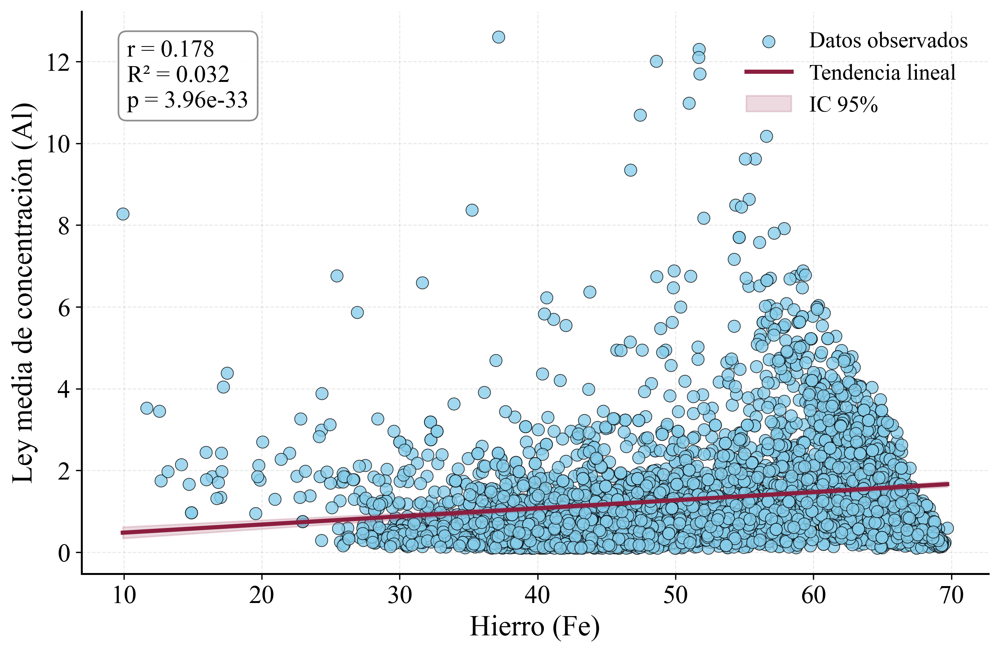

In [50]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

# ============================
# 1. Datos
# ============================
data = jmq[['Fe', 'Al']].dropna()

x = data['Fe']
y = data['Al']

# ============================
# 2. Regresión lineal simple
# ============================
slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)

x_line = np.linspace(x.min(), x.max(), 200)
y_line = slope * x_line + intercept

# ============================
# 3. Banda de confianza 95%
# ============================
n = len(x)
y_pred = slope * x + intercept
residuals = y - y_pred
s_err = np.sqrt(np.sum(residuals**2) / (n - 2))

t_value = stats.t.ppf(0.975, n - 2)

mean_x = np.mean(x)
confidence = t_value * s_err * np.sqrt(
    1/n + (x_line - mean_x)**2 / np.sum((x - mean_x)**2)
)

upper = y_line + confidence
lower = y_line - confidence

# ============================
# 4. Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'axes.linewidth': 1.2
})

fig, ax = plt.subplots(figsize=(9, 6), dpi=300)

# ============================
# 5. Diagrama de dispersión
# ============================
ax.scatter(
    x,
    y,
    s=58,
    color='skyblue',
    edgecolor='black',
    linewidth=0.45,
    alpha=0.78,
    label='Datos observados'
)

# Línea de tendencia
ax.plot(
    x_line,
    y_line,
    color='#8B1E3F',
    linewidth=2.6,
    label='Tendencia lineal'
)

# Banda de confianza
ax.fill_between(
    x_line,
    lower,
    upper,
    color='#8B1E3F',
    alpha=0.16,
    label='IC 95%'
)

# ============================
# 6. Etiquetas
# ============================
ax.set_xlabel('Hierro (Fe)')
ax.set_ylabel('Ley media de concentración (Al)')

# ============================
# 7. Cuadro estadístico
# ============================
texto = (
    f'r = {r_value:.3f}\n'
    f'R² = {r_value**2:.3f}\n'
    f'p = {p_value:.3g}'
)

ax.text(
    0.05,
    0.95,
    texto,
    transform=ax.transAxes,
    ha='left',
    va='top',
    fontsize=15,
    bbox=dict(
        boxstyle='round,pad=0.35',
        facecolor='white',
        edgecolor='gray',
        alpha=0.90
    )
)

# ============================
# 8. Estética final
# ============================
ax.grid(
    True,
    linestyle='--',
    linewidth=0.6,
    alpha=0.30
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    frameon=False,
    loc='upper right',
    fontsize=14
)

plt.tight_layout()

plt.savefig(
    'dispersion__Q1.png',
    dpi=800,
    bbox_inches='tight'
)

#plt.savefig(
    #'dispersion_FP_X50_Q1.png',
    #dpi=800,
    #bbox_inches='tight'
#)

plt.show()

### EDA Multivariable

#### Matriz de correlación 

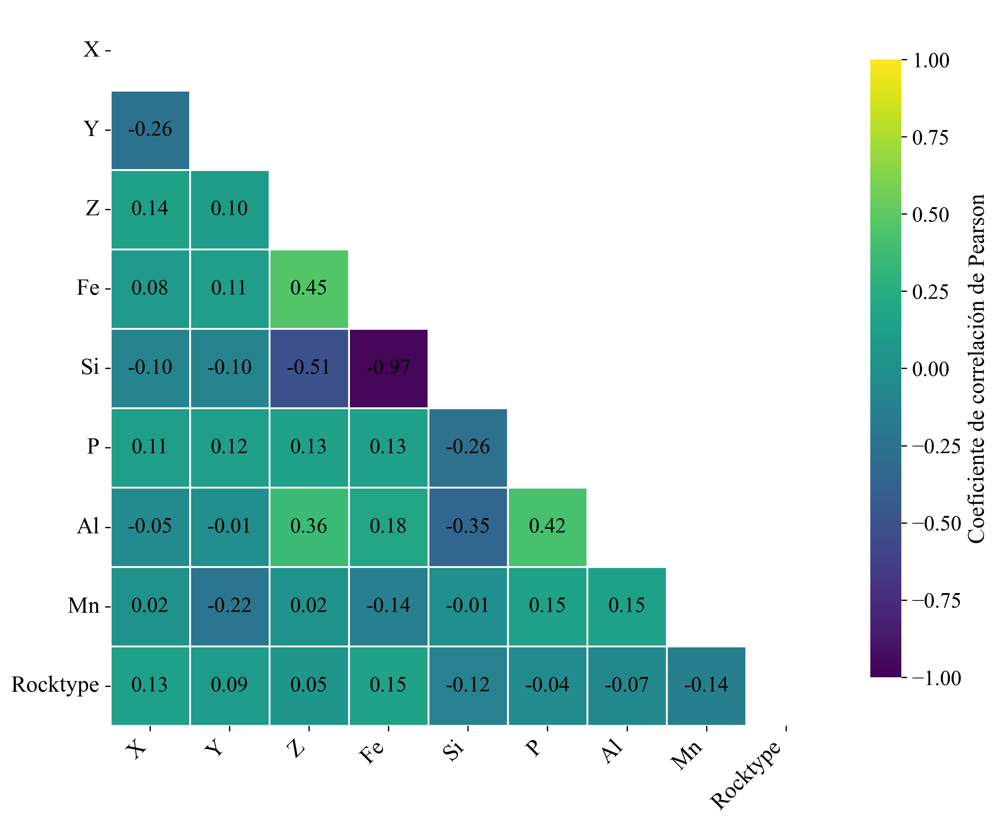

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ============================
# 1. Selección de variables
# ============================
variables = ['X', 'Y', 'Z', 'Fe', 'Si', 'P', 'Al', 'Mn', 'Rocktype' ]

data_corr = jmq[variables].dropna()

# Matriz de correlación de Pearson
correlacion = data_corr.corr(method='pearson')

# Máscara para mostrar solo triángulo inferior
mask = np.triu(np.ones_like(correlacion, dtype=bool))

# ============================
# 2. Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 15,
    'ytick.labelsize': 15,
    'axes.linewidth': 1.2
})

# ============================
# 3. Figura
# ============================
fig, ax = plt.subplots(figsize=(9.5, 8), dpi=300)

heatmap = sns.heatmap(
    correlacion,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap='viridis',
    center=0,
    vmin=-1,
    vmax=1,
    square=True,
    linewidths=0.8,
    linecolor='white',
    cbar_kws={
        'shrink': 0.82,
        'label': 'Coeficiente de correlación de Pearson'
    },
    annot_kws={
        'fontsize': 14,
        'fontfamily': 'serif',
        'color': 'black'
    },
    ax=ax
)

# ============================
# 4. Etiquetas
# ============================
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    ha='right',
    fontsize=15,
    fontfamily='serif'
)

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0,
    fontsize=15,
    fontfamily='serif'
)

# Sin título para estilo artículo Q1
ax.set_xlabel('')
ax.set_ylabel('')

# Ajustar barra de color
cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=14)
cbar.set_label(
    'Coeficiente de correlación de Pearson',
    fontsize=15,
    family='serif'
)

# ============================
# 5. Guardado
# ============================
plt.tight_layout()

plt.savefig(
    'matriz_correlacion_Pearson_Q1.png',
    dpi=800,
    bbox_inches='tight'
)
#plt.savefig(
    #'matriz_correlacion_Pearson_Q1.png',
    #dpi=800,
    #bbox_inches='tight'
#)

plt.show()


#### Pair plot

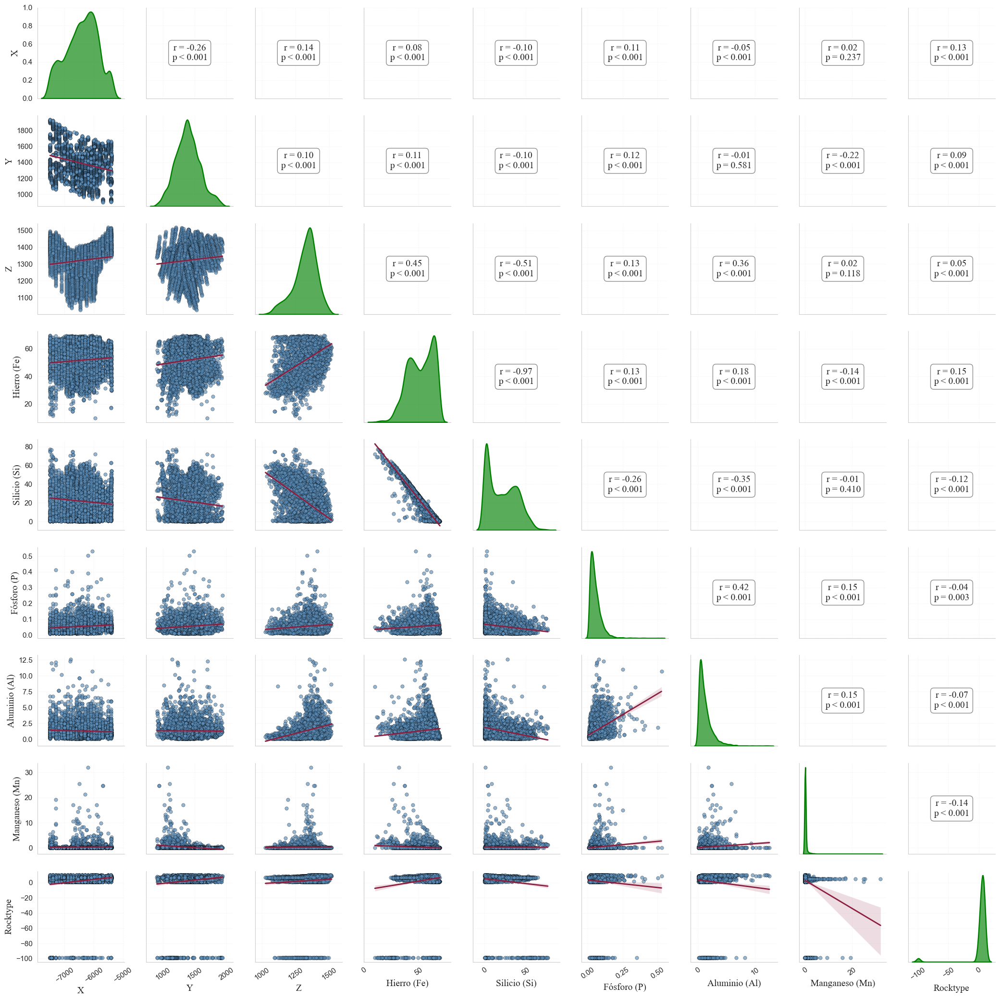

In [54]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import pearsonr

# ============================
# 1. Variables de análisis
# ============================
variables = ['X', 'Y', 'Z', 'Fe', 'Si', 'P', 'Al', 'Mn', 'Rocktype']

nombres_publicacion = {
    'X': 'X',
    'Y': 'Y',
    'Z': 'Z',
    'Fe': 'Hierro (Fe)',
    'Si': 'Silicio (Si)',
    'P': 'Fósforo (P)',
    'Al': 'Aluminio (Al)',
    'Mn': 'Manganeso (Mn)',
    'Rocktype': 'Rocktype'
}

data = jmq[variables].dropna().rename(columns=nombres_publicacion)

# ============================
# 2. Estilo profesional
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'axes.linewidth': 1.0
})

sns.set_style("whitegrid", {
    "grid.linestyle": "--",
    "grid.color": "0.85"
})

# ============================
# 3. Función para correlación
# ============================
def corr_text(x, y, **kwargs):
    r, p = pearsonr(x, y)
    ax = plt.gca()

    if p < 0.001:
        p_text = "p < 0.001"
    else:
        p_text = f"p = {p:.3f}"

    ax.annotate(
        f"r = {r:.2f}\n{p_text}",
        xy=(0.5, 0.5),
        xycoords=ax.transAxes,
        ha='center',
        va='center',
        fontsize=14,
        fontfamily='serif',
        bbox=dict(
            boxstyle='round,pad=0.35',
            facecolor='white',
            edgecolor='gray',
            alpha=0.90
        )
    )

# ============================
# 4. Construcción del PairGrid
# ============================
g = sns.PairGrid(
    data,
    diag_sharey=False,
    height=2.35,
    despine=True
)

# Diagonal: distribución KDE
g.map_diag(
    sns.kdeplot,
    fill=True,
    color='green',
    linewidth=1.8,
    alpha=0.65
)

# Parte inferior: dispersión + regresión
g.map_lower(
    sns.regplot,
    scatter_kws={
        's': 28,
        'alpha': 0.65,
        'edgecolors': 'black',
        'linewidths': 0.35
    },
    line_kws={
        'color': '#8B1E3F',
        'linewidth': 2.0
    },
    color='#5B8DB8',
    ci=95
)

# Parte superior: correlaciones
g.map_upper(corr_text)

# ============================
# 5. Ajustes finales
# ============================
for ax in g.axes.flatten():
    if ax is not None:
        ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.30)
        ax.tick_params(axis='both', labelsize=11)

        for spine in ax.spines.values():
            spine.set_linewidth(0.8)

# Etiquetas inferiores
for ax in g.axes[-1, :]:
    ax.set_xlabel(ax.get_xlabel(), fontsize=14, fontfamily='serif')
    ax.tick_params(axis='x', rotation=35)

# Etiquetas laterales
for ax in g.axes[:, 0]:
    ax.set_ylabel(ax.get_ylabel(), fontsize=14, fontfamily='serif')

plt.tight_layout()

g.fig.savefig(
    'pairplot_variables_leyes_Q1.png',
    dpi=800,
    bbox_inches='tight'
)
#g.fig.savefig(
   # 'pairplot_variables_fragmentacion_Q1.png',
   # dpi=800,
   # bbox_inches='tight'
#)

plt.show()

### Modelos de aprendizaje supervisado - Regresión

#### Regresión lineal simple

In [55]:
import statsmodels.api as sm
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ============================
# 1. Selección de variables
# ============================
data = jmq[['Fe', 'Al']].dropna()

X = data[['Fe']]     # Variable independiente
y = data['Al']         # Variable dependiente

# Agregar constante
X = sm.add_constant(X)

# ============================
# 2. Ajustar modelo OLS
# ============================
modelo = sm.OLS(y, X).fit()

# Ver resumen del modelo
print(modelo.summary())

                            OLS Regression Results                            
Dep. Variable:                     Al   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     146.1
Date:                Fri, 05 Jun 2026   Prob (F-statistic):           3.96e-33
Time:                        08:06:05   Log-Likelihood:                -7396.7
No. Observations:                4465   AIC:                         1.480e+04
Df Residuals:                    4463   BIC:                         1.481e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2826      0.087      3.248      0.0

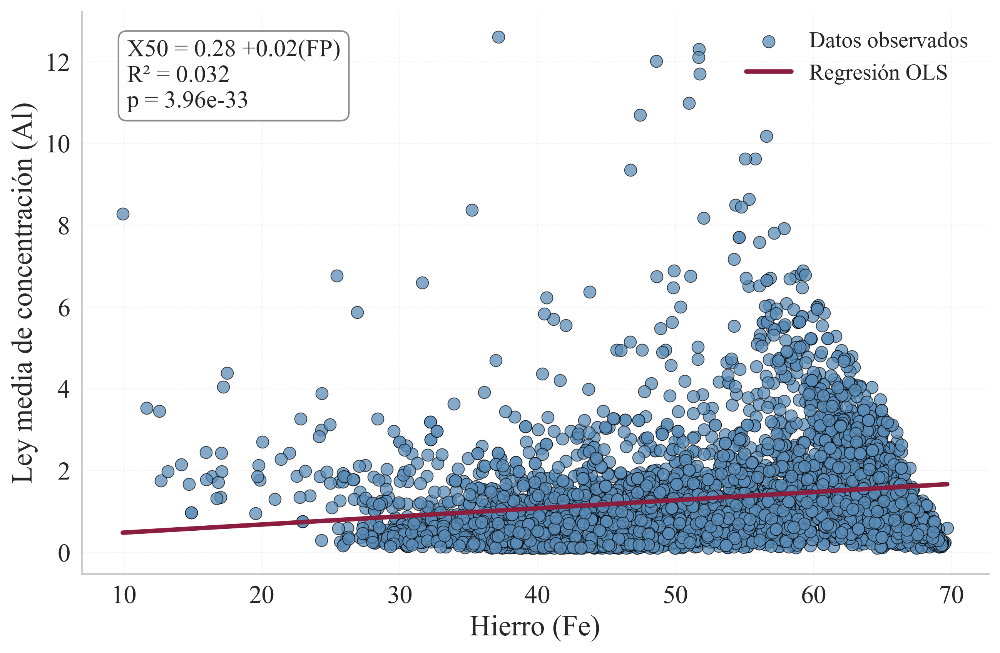

In [57]:
# ============================
# 4. Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'axes.linewidth': 1.2
})

fig, ax = plt.subplots(figsize=(9, 6), dpi=300)

# ============================
# 5. Datos reales
# ============================
ax.scatter(
    X['Fe'],
    y,
    s=58,
    color='#5B8DB8',
    edgecolor='black',
    linewidth=0.45,
    alpha=0.75,
    label='Datos observados'
)

# ============================
# 6. Línea de regresión ordenada
# ============================
orden = np.argsort(X['Fe'].values)

ax.plot(
    X['Fe'].values[orden],
    y_pred.values[orden],
    color='#8B1E3F',
    linewidth=2.8,
    label='Regresión OLS'
)

# ============================
# 7. Ecuación y métricas
# ============================
b0 = modelo.params['const']
b1 = modelo.params['Fe']
r2 = modelo.rsquared
p_value = modelo.pvalues['Fe']

texto = (
    f'X50 = {b0:.2f} {b1:+.2f}(FP)\n'
    f'R² = {r2:.3f}\n'
    f'p = {p_value:.3g}'
)

ax.text(
    0.05,
    0.95,
    texto,
    transform=ax.transAxes,
    ha='left',
    va='top',
    fontsize=15,
    bbox=dict(
        boxstyle='round,pad=0.35',
        facecolor='white',
        edgecolor='gray',
        alpha=0.90
    )
)

# ============================
# 8. Etiquetas
# ============================
ax.set_xlabel('Hierro (Fe)')
ax.set_ylabel('Ley media de concentración (Al)')

# ============================
# 9. Estética final
# ============================
ax.grid(
    True,
    linestyle='--',
    linewidth=0.6,
    alpha=0.30
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    frameon=False,
    loc='upper right',
    fontsize=14
)

plt.tight_layout()

plt.savefig(
    'regresion_OLS_Fe_Al_Q1.png',
    dpi=800,
    bbox_inches='tight'
)

#plt.savefig(
    #'regresion_OLS_X50_FP_Q1.png',
    #dpi=800,
    #bbox_inches='tight'
#)

plt.show()

#### Regresión lineal múltiple

In [58]:
import statsmodels.api as sm
import pandas as pd
import numpy as np

# ============================
# 1. Selección de variables
# ============================
variables_predictoras = ['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']
variable_dependiente = 'Fe'

data = jmq[variables_predictoras + [variable_dependiente]].dropna()

X = data[variables_predictoras]
y = data[variable_dependiente]

# ============================
# 2. Agregar constante
# ============================
X_const = sm.add_constant(X)

# ============================
# 3. Ajustar modelo OLS múltiple
# ============================
modelo = sm.OLS(y, X_const).fit()

# ============================
# 4. Resumen del modelo
# ============================
print(modelo.summary())


                            OLS Regression Results                            
Dep. Variable:                     Fe   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                 1.387e+05
Date:                Fri, 05 Jun 2026   Prob (F-statistic):               0.00
Time:                        08:11:16   Log-Likelihood:                -5238.3
No. Observations:                4465   AIC:                         1.049e+04
Df Residuals:                    4457   BIC:                         1.054e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         70.8545      0.284    249.411      0.0

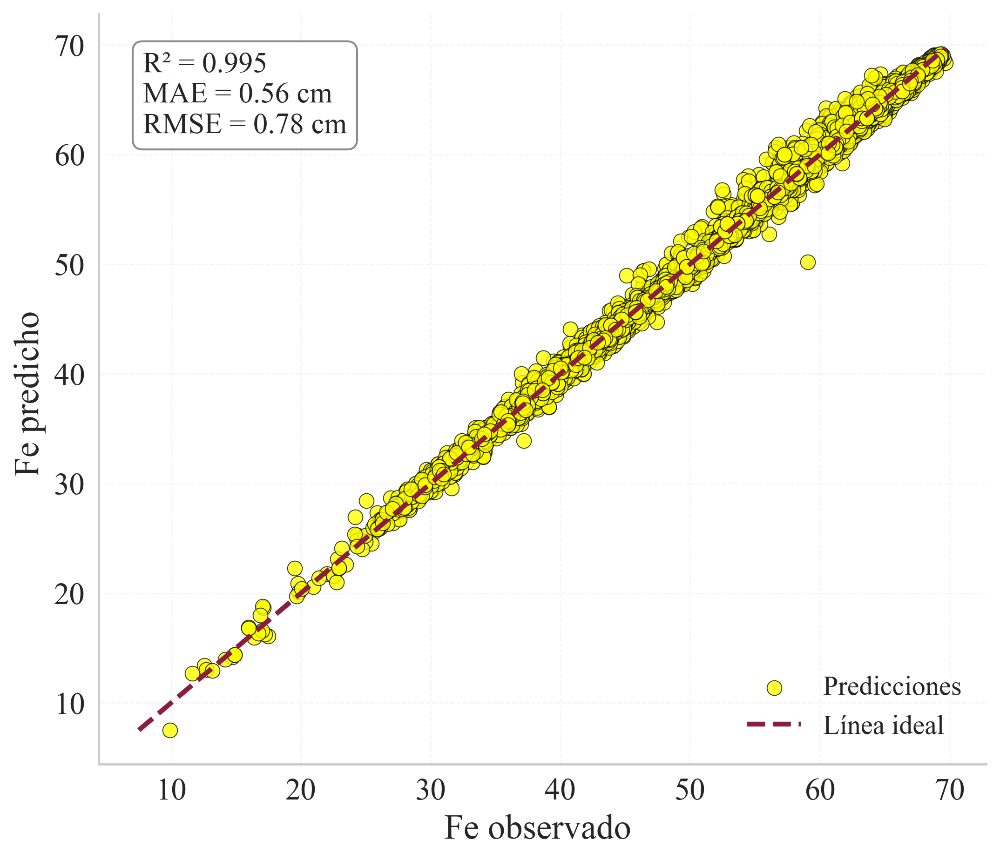

In [60]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# ============================
# 1. Predicción del modelo múltiple
# ============================
y_pred = modelo.predict(X_const)

# Métricas
r2 = r2_score(y, y_pred)
mae = mean_absolute_error(y, y_pred)
rmse = np.sqrt(mean_squared_error(y, y_pred))

# ============================
# 2. Estilo profesional Q1
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
    'axes.linewidth': 1.2
})

fig, ax = plt.subplots(figsize=(7.5, 6.5), dpi=300)

# ============================
# 3. Valores reales vs predichos
# ============================
ax.scatter(
    y,
    y_pred,
    s=58,
    color='yellow',
    edgecolor='black',
    linewidth=0.45,
    alpha=0.78,
    label='Predicciones'
)

# ============================
# 4. Línea ideal y = ŷ
# ============================
min_val = min(y.min(), y_pred.min())
max_val = max(y.max(), y_pred.max())

ax.plot(
    [min_val, max_val],
    [min_val, max_val],
    linestyle='--',
    color='#8B1E3F',
    linewidth=2.5,
    label='Línea ideal'
)

# ============================
# 5. Cuadro de métricas
# ============================
texto = (
    f'R² = {r2:.3f}\n'
    f'MAE = {mae:.2f} cm\n'
    f'RMSE = {rmse:.2f} cm'
)

ax.text(
    0.05,
    0.95,
    texto,
    transform=ax.transAxes,
    ha='left',
    va='top',
    fontsize=15,
    bbox=dict(
        boxstyle='round,pad=0.35',
        facecolor='white',
        edgecolor='gray',
        alpha=0.90
    )
)

# ============================
# 6. Etiquetas
# ============================
ax.set_xlabel('Fe observado ')
ax.set_ylabel('Fe predicho ')

# ============================
# 7. Estética final
# ============================
ax.grid(
    True,
    linestyle='--',
    linewidth=0.6,
    alpha=0.30
)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.legend(
    frameon=False,
    loc='lower right',
    fontsize=14
)

plt.tight_layout()

plt.savefig(
    'regresion_multiple_X50_real_vs_predicho_Q1.png',
    dpi=800,
    bbox_inches='tight'
)

#plt.savefig(
    #'regresion_multiple_X50_real_vs_predicho_Q1.png',
    #dpi=800,
    #bbox_inches='tight'
#)

plt.show()

#### Support Vector Regression (SVR)

In [61]:
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import numpy as np

# ============================
# 1. Variables
# ============================
X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores faltantes
data = pd.concat([X, y], axis=1).dropna()
X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

# ============================
# 2. División entrenamiento/prueba
# ============================
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================
# 3. Pipeline rápido: escalamiento + SVR
# ============================
modelo_svr = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

# ============================
# 4. Búsqueda rápida de hiperparámetros
# ============================
param_grid = {
    'svr__kernel': ['rbf', 'linear'],
    'svr__C': [1, 10, 50],
    'svr__epsilon': [0.1, 0.5],
    'svr__gamma': ['scale']
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    modelo_svr,
    param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train, y_train)

# Mejor modelo
best_model = grid.best_estimator_

print("Mejores hiperparámetros:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Mejores hiperparámetros:
{'svr__C': 50, 'svr__epsilon': 0.5, 'svr__gamma': 'scale', 'svr__kernel': 'linear'}

Mejor R² promedio en validación cruzada:
0.995


In [62]:
# ============================
# 5. Validación cruzada KFold = 5
# ============================
scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_model,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5:")
print(tabla_kfold.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5:
   Fold     R²    MAE   RMSE
0     1  0.995  0.583  0.837
1     2  0.995  0.564  0.823
2     3  0.996  0.540  0.751
3     4  0.996  0.519  0.716
4     5  0.994  0.580  0.885

Promedio K-Fold:
R²      0.995
MAE     0.557
RMSE    0.802
dtype: float64


In [63]:
# ============================
# 6. Predicciones finales
# ============================
y_train_pred = best_model.predict(X_train)
y_test_pred = best_model.predict(X_test)

# ============================
# 7. Función de métricas
# ============================
def metricas(y_real, y_pred, nombre):
    mae = mean_absolute_error(y_real, y_pred)
    mse = mean_squared_error(y_real, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_real, y_pred)
    
    return {
        'Conjunto': nombre,
        'MAE': mae,
        'RMSE': rmse,
        'R²': r2
    }

tabla_metricas = pd.DataFrame([
    metricas(y_train, y_train_pred, 'Entrenamiento'),
    metricas(y_test, y_test_pred, 'Prueba')
])

print("\nMétricas finales:")
print(tabla_metricas.round(3))


Métricas finales:
        Conjunto    MAE   RMSE     R²
0  Entrenamiento  0.554  0.801  0.995
1         Prueba  0.537  0.751  0.996


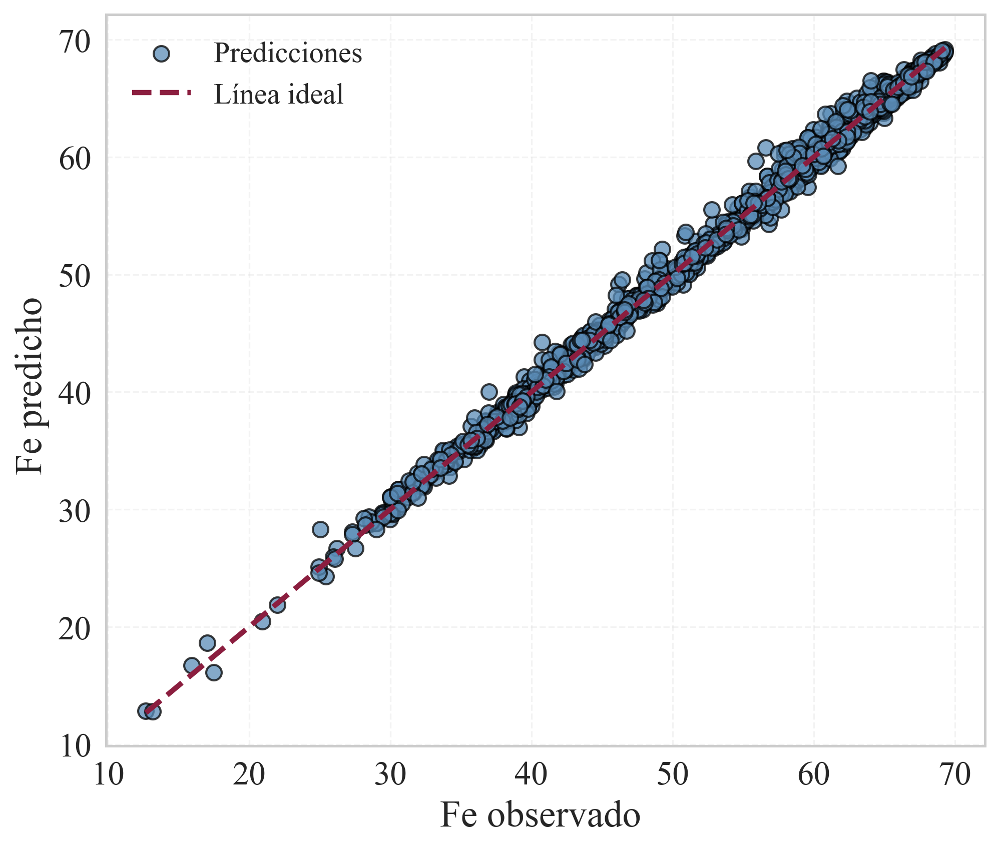

In [65]:
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18
})

plt.figure(figsize=(7, 6), dpi=300)

plt.scatter(
    y_test,
    y_test_pred,
    alpha=0.75,
    edgecolor='black',
    color='#5B8DB8',
    s=55,
    label='Predicciones'
)

min_val = min(y_test.min(), y_test_pred.min())
max_val = max(y_test.max(), y_test_pred.max())

plt.plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2.5,
    label='Línea ideal'
)

plt.xlabel('Fe observado ')
plt.ylabel('Fe predicho ')
plt.legend(frameon=False)
plt.grid(True, linestyle='--', alpha=0.30)
plt.tight_layout()
plt.savefig(
    'regresion_multiple_X50_real_vs_predicho_Q1.png',
    dpi=800,
    bbox_inches='tight'
)
plt.show()

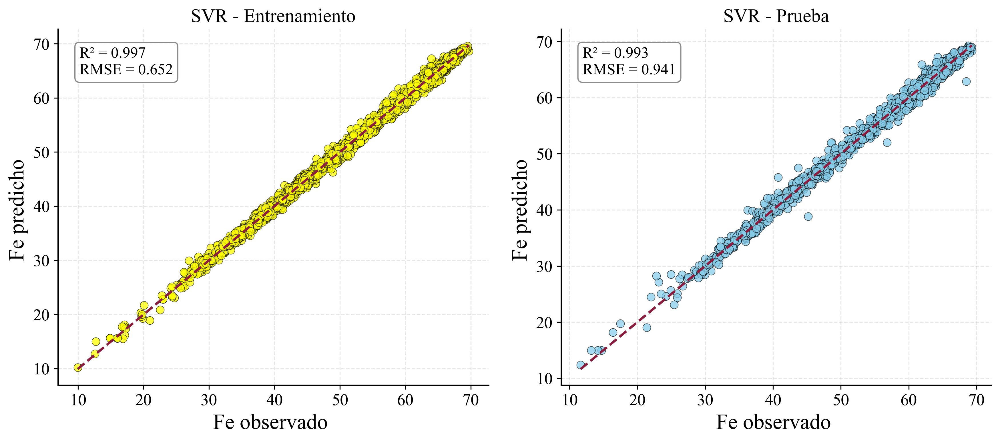

In [21]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# ============================
# 1. Métricas
# ============================
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred))

# ============================
# 2. Estilo profesional
# ============================
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

# ============================
# 3. Figura con dos paneles
# ============================
fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

# ----------------------------
# Entrenamiento
# ----------------------------
min_train = min(y_train.min(), y_train_pred.min())
max_train = max(y_train.max(), y_train_pred.max())

axes[0].scatter(
    y_train,
    y_train_pred,
    alpha=0.75,
    color='yellow',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_train, max_train],
    [min_train, max_train],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('SVR - Entrenamiento', fontsize=16)
axes[0].grid(True, linestyle='--', alpha=0.30)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f}',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ----------------------------
# Prueba
# ----------------------------
min_test = min(y_test.min(), y_test_pred.min())
max_test = max(y_test.max(), y_test_pred.max())

axes[1].scatter(
    y_test,
    y_test_pred,
    alpha=0.75,
    color='skyblue',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_test, max_test],
    [min_test, max_test],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('SVR - Prueba', fontsize=16)
axes[1].grid(True, linestyle='--', alpha=0.30)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f}',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()

plt.savefig('SVR_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('SVR_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()

#### Árboles de decisión (DT)

In [23]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================
# 1. Variables predictoras y objetivo
# ============================
X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores vacíos
data = pd.concat([X, y], axis=1).dropna()
X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

# ============================
# 2. División entrenamiento/prueba
# ============================
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================
# 3. Modelo árbol de decisión
# ============================
dt = DecisionTreeRegressor(random_state=42)

# Grilla rápida para clase
param_grid = {
    'max_depth': [3, 5, 7, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['squared_error', 'absolute_error']
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    dt,
    param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train, y_train)

best_model_dt = grid.best_estimator_

print("Mejores hiperparámetros:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Mejores hiperparámetros:
{'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2}

Mejor R² promedio en validación cruzada:
0.984


In [24]:
# ============================
# 4. Validación cruzada K-Fold 5
# ============================
scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_model_dt,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold_dt = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5 - Árbol de decisión:")
print(tabla_kfold_dt.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold_dt[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5 - Árbol de decisión:
   Fold     R²    MAE   RMSE
0     1  0.987  0.865  1.317
1     2  0.985  0.883  1.381
2     3  0.987  0.866  1.289
3     4  0.985  0.907  1.431
4     5  0.975  0.944  1.873

Promedio K-Fold:
R²      0.984
MAE     0.893
RMSE    1.458
dtype: float64


In [25]:
# ============================
# 5. Predicciones
# ============================
y_train_pred_dt = best_model_dt.predict(X_train)
y_test_pred_dt = best_model_dt.predict(X_test)

# ============================
# 6. Función de evaluación
# ============================
def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

evaluar(y_train, y_train_pred_dt, "Entrenamiento")
evaluar(y_test, y_test_pred_dt, "Prueba")


Entrenamiento:
MAE:  0.000
MSE:  0.000
RMSE: 0.000
R²:   1.000

Prueba:
MAE:  0.857
MSE:  2.151
RMSE: 1.467
R²:   0.984


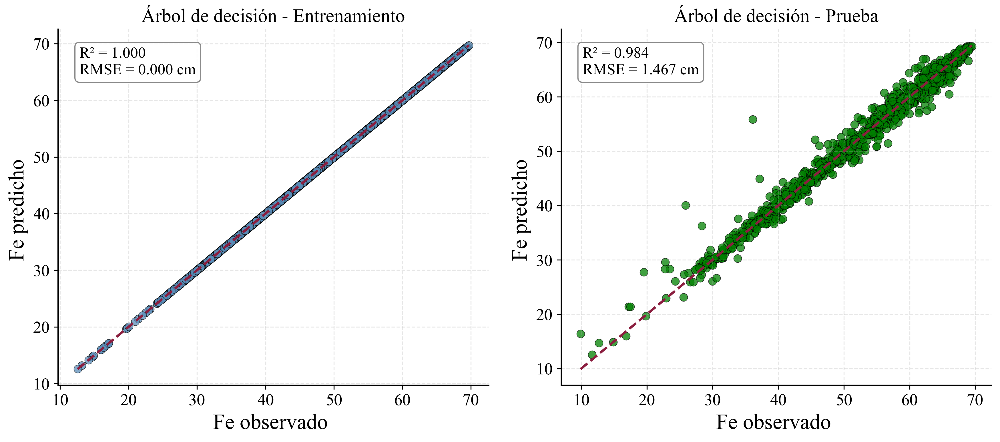

In [26]:
# ============================
# 7. Figura profesional
# ============================
r2_train = r2_score(y_train, y_train_pred_dt)
r2_test = r2_score(y_test, y_test_pred_dt)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_dt))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_dt))

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

# ----------------------------
# Entrenamiento
# ----------------------------
min_train = min(y_train.min(), y_train_pred_dt.min())
max_train = max(y_train.max(), y_train_pred_dt.max())

axes[0].scatter(
    y_train,
    y_train_pred_dt,
    alpha=0.75,
    color='#5B8DB8',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_train, max_train],
    [min_train, max_train],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('Árbol de decisión - Entrenamiento', fontsize=16)
axes[0].grid(True, linestyle='--', alpha=0.30)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f} cm',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ----------------------------
# Prueba
# ----------------------------
min_test = min(y_test.min(), y_test_pred_dt.min())
max_test = max(y_test.max(), y_test_pred_dt.max())

axes[1].scatter(
    y_test,
    y_test_pred_dt,
    alpha=0.75,
    color='green',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_test, max_test],
    [min_test, max_test],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('Árbol de decisión - Prueba', fontsize=16)
axes[1].grid(True, linestyle='--', alpha=0.30)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f} cm',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()

plt.savefig('arbol_decision_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('arbol_decision_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()

#### Random Forest Regression (RF)

In [2]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================
# 1. Variables predictoras y objetivo
# ============================
X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores faltantes
data = pd.concat([X, y], axis=1).dropna()
X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

# ============================
# 2. División entrenamiento / prueba
# ============================
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================
# 3. Random Forest
# ============================
rf = RandomForestRegressor(
    random_state=42,
    n_jobs=-1
)

# Grilla rápida para clase
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 8, 12, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', None]
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train, y_train)

best_rf = grid.best_estimator_

print("Mejores hiperparámetros:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Mejores hiperparámetros:
{'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

Mejor R² promedio en validación cruzada:
0.99


In [3]:
# ============================
# 4. Validación cruzada K-Fold 5
# ============================
scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_rf,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold_rf = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5 - Random Forest:")
print(tabla_kfold_rf.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold_rf[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5 - Random Forest:
   Fold     R²    MAE   RMSE
0     1  0.991  0.635  1.108
1     2  0.993  0.608  0.982
2     3  0.993  0.648  0.913
3     4  0.987  0.679  1.303
4     5  0.986  0.699  1.389

Promedio K-Fold:
R²      0.990
MAE     0.654
RMSE    1.139
dtype: float64


In [4]:
# ============================
# 5. Predicciones
# ============================
y_train_pred_rf = best_rf.predict(X_train)
y_test_pred_rf = best_rf.predict(X_test)

# ============================
# 6. Función de evaluación
# ============================
def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

evaluar(y_train, y_train_pred_rf, "Entrenamiento")
evaluar(y_test, y_test_pred_rf, "Prueba")


Entrenamiento:
MAE:  0.229
MSE:  0.174
RMSE: 0.417
R²:   0.999

Prueba:
MAE:  0.628
MSE:  1.145
RMSE: 1.070
R²:   0.992


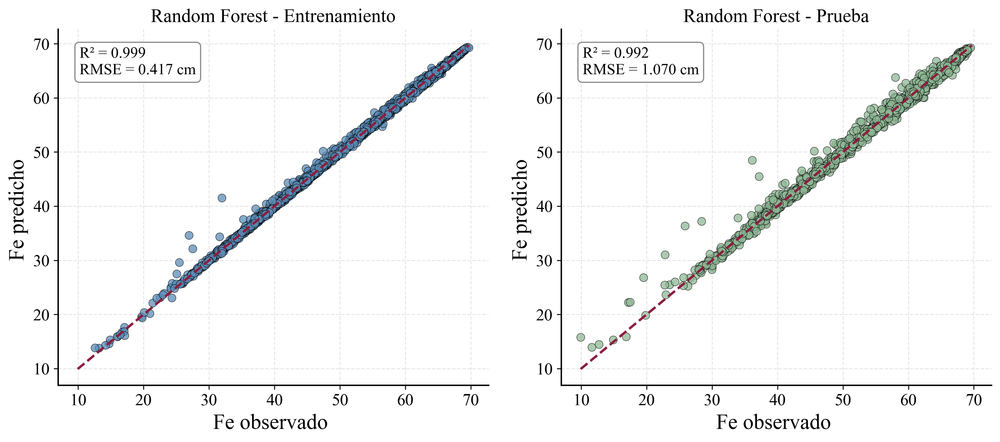

In [5]:
# ============================
# 7. Figura: observado vs predicho
# ============================
r2_train = r2_score(y_train, y_train_pred_rf)
r2_test = r2_score(y_test, y_test_pred_rf)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_rf))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_rf))

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

# Rango común para ambos gráficos
min_val = min(y.min(), y_train_pred_rf.min(), y_test_pred_rf.min())
max_val = max(y.max(), y_train_pred_rf.max(), y_test_pred_rf.max())

# ----------------------------
# Entrenamiento
# ----------------------------
axes[0].scatter(
    y_train,
    y_train_pred_rf,
    alpha=0.75,
    color='#5B8DB8',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('Random Forest - Entrenamiento', fontsize=16)
axes[0].grid(True, linestyle='--', alpha=0.30)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f} cm',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ----------------------------
# Prueba
# ----------------------------
axes[1].scatter(
    y_test,
    y_test_pred_rf,
    alpha=0.75,
    color='#8FB996',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('Random Forest - Prueba', fontsize=16)
axes[1].grid(True, linestyle='--', alpha=0.30)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f} cm',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('random_forest_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('random_forest_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()

#### Extreme Gradient Boosting (XGBoost)

In [18]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

In [19]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
param_grid = {
    'n_estimators': [50, 100],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3],  
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],  
    'objective': ['reg:squarederror']  # función de pérdida
}
xgb = XGBRegressor(random_state=42)

grid = GridSearchCV(xgb, param_grid, cv=3, scoring='r2', n_jobs=-1)
grid.fit(X_train, y_train)

best_xgb = grid.best_estimator_
print("🔍 Mejor combinación de hiperparámetros:")
print(grid.best_params_)
def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"\n📊 {conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

y_train_pred = best_xgb.predict(X_train)
y_test_pred = best_xgb.predict(X_test)

evaluar(y_train, y_train_pred, "Entrenamiento")
evaluar(y_test, y_test_pred, "Prueba")


🔍 Mejor combinación de hiperparámetros:
{'colsample_bytree': 0.8, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'objective': 'reg:squarederror', 'subsample': 1.0}

📊 Entrenamiento:
MAE:  0.501
MSE:  0.425
RMSE: 0.652
R²:   0.997

📊 Prueba:
MAE:  0.677
MSE:  0.886
RMSE: 0.941
R²:   0.993


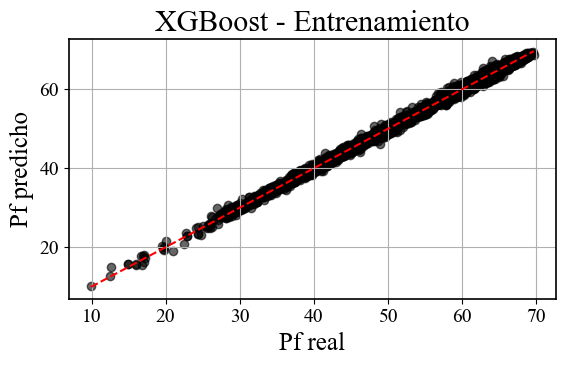

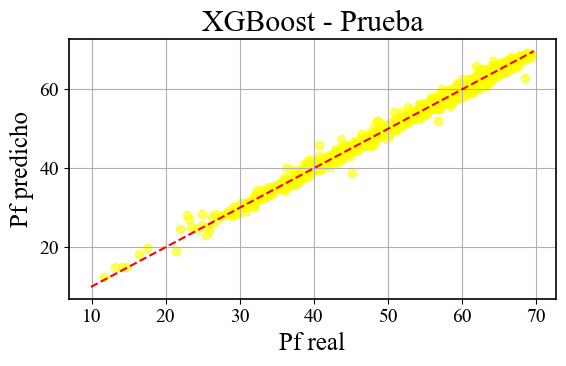

In [20]:
# Entrenamiento
plt.figure(figsize=(6,4))
plt.scatter(y_train, y_train_pred, alpha=0.6,color='black')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.xlabel('Pf real')
plt.ylabel('Pf predicho')
plt.title('XGBoost - Entrenamiento')
plt.grid(True)
plt.tight_layout()
plt.show()

# Prueba
plt.figure(figsize=(6,4))
plt.scatter(y_test, y_test_pred, alpha=0.6, color='yellow')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')
plt.xlabel('Pf real')
plt.ylabel('Pf predicho')
plt.title('XGBoost - Prueba')
plt.grid(True)
plt.tight_layout()
plt.savefig('random_forest_entrenamiento_xgboost_Fe.png', dpi=800, bbox_inches='tight')
plt.savefig('random_forest_preferido_xgboost_Fe.png', dpi=800, bbox_inches='tight')
plt.show()


#### Red Neuronal Artificial (ANN)

In [30]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================
# 1. Variables predictoras y objetivo
# ============================
X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores faltantes
data = pd.concat([X, y], axis=1).dropna()
X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

# ============================
# 2. División entrenamiento/prueba
# ============================
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================
# 3. Modelo XGBoost
# ============================
xgb = XGBRegressor(
    objective='reg:squarederror',
    random_state=42,
    n_jobs=-1
)

# Grilla rápida para clase
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.05, 0.10],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train, y_train)

best_xgb = grid.best_estimator_

print("Mejores hiperparámetros:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Mejores hiperparámetros:
{'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 200, 'subsample': 0.8}

Mejor R² promedio en validación cruzada:
0.994


In [31]:
# ============================
# 4. Validación cruzada K-Fold 5
# ============================
scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_xgb,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold_xgb = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5 - XGBoost:")
print(tabla_kfold_xgb.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold_xgb[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5 - XGBoost:
   Fold     R²    MAE   RMSE
0     1  0.993  0.558  0.963
1     2  0.996  0.509  0.720
2     3  0.995  0.551  0.753
3     4  0.991  0.575  1.074
4     5  0.992  0.579  1.065

Promedio K-Fold:
R²      0.994
MAE     0.554
RMSE    0.915
dtype: float64


In [32]:
# ============================
# 5. Predicciones
# ============================
y_train_pred_xgb = best_xgb.predict(X_train)
y_test_pred_xgb = best_xgb.predict(X_test)

# ============================
# 6. Función de evaluación
# ============================
def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

evaluar(y_train, y_train_pred_xgb, "Entrenamiento")
evaluar(y_test, y_test_pred_xgb, "Prueba")


Entrenamiento:
MAE:  0.356
MSE:  0.222
RMSE: 0.471
R²:   0.998

Prueba:
MAE:  0.567
MSE:  0.841
RMSE: 0.917
R²:   0.994


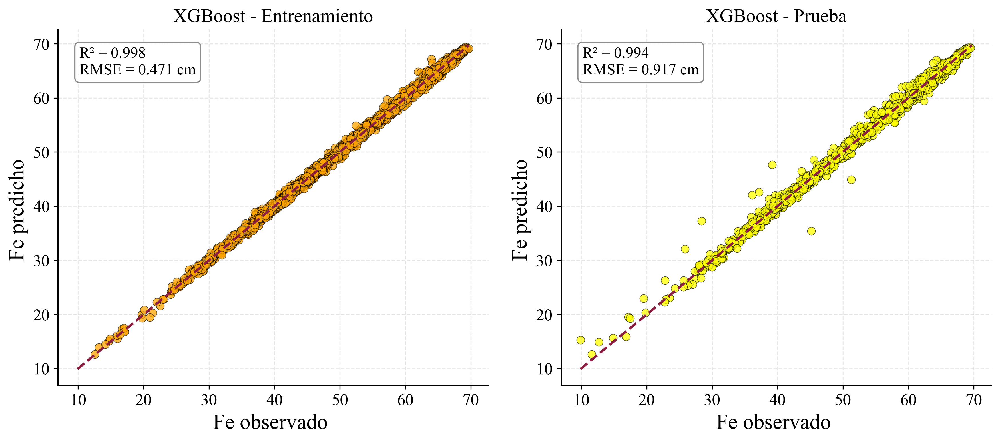

In [35]:
# ============================
# 7. Figura: observado vs predicho
# ============================
r2_train = r2_score(y_train, y_train_pred_xgb)
r2_test = r2_score(y_test, y_test_pred_xgb)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_xgb))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_xgb))

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

# Rango común
min_val = min(y.min(), y_train_pred_xgb.min(), y_test_pred_xgb.min())
max_val = max(y.max(), y_train_pred_xgb.max(), y_test_pred_xgb.max())

# ----------------------------
# Entrenamiento
# ----------------------------
axes[0].scatter(
    y_train,
    y_train_pred_xgb,
    alpha=0.75,
    color='orange',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('XGBoost - Entrenamiento', fontsize=16)
axes[0].grid(True, linestyle='--', alpha=0.30)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f} cm',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ----------------------------
# Prueba
# ----------------------------
axes[1].scatter(
    y_test,
    y_test_pred_xgb,
    alpha=0.75,
    color='yellow',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('XGBoost - Prueba', fontsize=16)
axes[1].grid(True, linestyle='--', alpha=0.30)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f} cm',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('xgboost_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('xgboost_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()

### ANN-MLP

In [2]:
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate, learning_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================
# 1. Variables predictoras y objetivo
# ============================
X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores faltantes
data = pd.concat([X, y], axis=1).dropna()

X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

# ============================
# 2. División entrenamiento/prueba
# ============================
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================
# 3. Pipeline: escalamiento + ANN-MLP
# ============================
mlp_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('mlp', MLPRegressor(
        random_state=42,
        max_iter=1500,
        early_stopping=True,
        validation_fraction=0.15,
        n_iter_no_change=30
    ))
])

# ============================
# 4. Grilla rápida de hiperparámetros
# ============================
param_grid = {
    'mlp__hidden_layer_sizes': [(32,), (64,), (64, 32)],
    'mlp__activation': ['relu', 'tanh'],
    'mlp__alpha': [0.0001, 0.001, 0.01],
    'mlp__learning_rate_init': [0.001, 0.003],
    'mlp__solver': ['adam']
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    estimator=mlp_pipeline,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

# ============================
# 5. Entrenamiento
# ============================
grid.fit(X_train, y_train)

best_mlp = grid.best_estimator_

print("Mejores hiperparámetros ANN-MLP:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Mejores hiperparámetros ANN-MLP:
{'mlp__activation': 'tanh', 'mlp__alpha': 0.01, 'mlp__hidden_layer_sizes': (64, 32), 'mlp__learning_rate_init': 0.003, 'mlp__solver': 'adam'}

Mejor R² promedio en validación cruzada:
0.996


In [3]:
# ============================
# 6. Validación cruzada K-Fold 5
# ============================
scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_mlp,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold_mlp = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5 - ANN-MLP:")
print(tabla_kfold_mlp.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold_mlp[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5 - ANN-MLP:
   Fold     R²    MAE   RMSE
0     1  0.996  0.521  0.738
1     2  0.997  0.487  0.672
2     3  0.996  0.523  0.703
3     4  0.995  0.581  0.809
4     5  0.996  0.519  0.728

Promedio K-Fold:
R²      0.996
MAE     0.526
RMSE    0.730
dtype: float64


In [4]:
# ============================
# 7. Predicciones
# ============================
y_train_pred_mlp = best_mlp.predict(X_train)
y_test_pred_mlp = best_mlp.predict(X_test)

# ============================
# 8. Función de evaluación
# ============================
def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

evaluar(y_train, y_train_pred_mlp, "Entrenamiento")
evaluar(y_test, y_test_pred_mlp, "Prueba")


Entrenamiento:
MAE:  0.464
MSE:  0.400
RMSE: 0.633
R²:   0.997

Prueba:
MAE:  0.523
MSE:  0.516
RMSE: 0.718
R²:   0.996


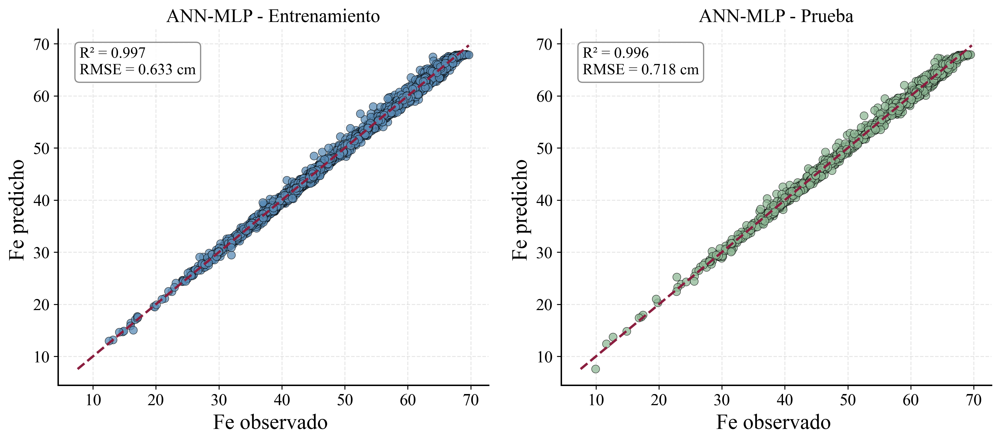

In [5]:
# ============================
# 9. Figura observado vs predicho
# ============================
r2_train = r2_score(y_train, y_train_pred_mlp)
r2_test = r2_score(y_test, y_test_pred_mlp)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_mlp))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_mlp))

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

min_val = min(y.min(), y_train_pred_mlp.min(), y_test_pred_mlp.min())
max_val = max(y.max(), y_train_pred_mlp.max(), y_test_pred_mlp.max())

# ----------------------------
# Entrenamiento
# ----------------------------
axes[0].scatter(
    y_train,
    y_train_pred_mlp,
    alpha=0.75,
    color='#5B8DB8',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('ANN-MLP - Entrenamiento', fontsize=16)
axes[0].grid(True, linestyle='--', alpha=0.30)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f} cm',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ----------------------------
# Prueba
# ----------------------------
axes[1].scatter(
    y_test,
    y_test_pred_mlp,
    alpha=0.75,
    color='#8FB996',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('ANN-MLP - Prueba', fontsize=16)
axes[1].grid(True, linestyle='--', alpha=0.30)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f} cm',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.9)
)

axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('ANN_MLP_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('ANN_MLP_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()

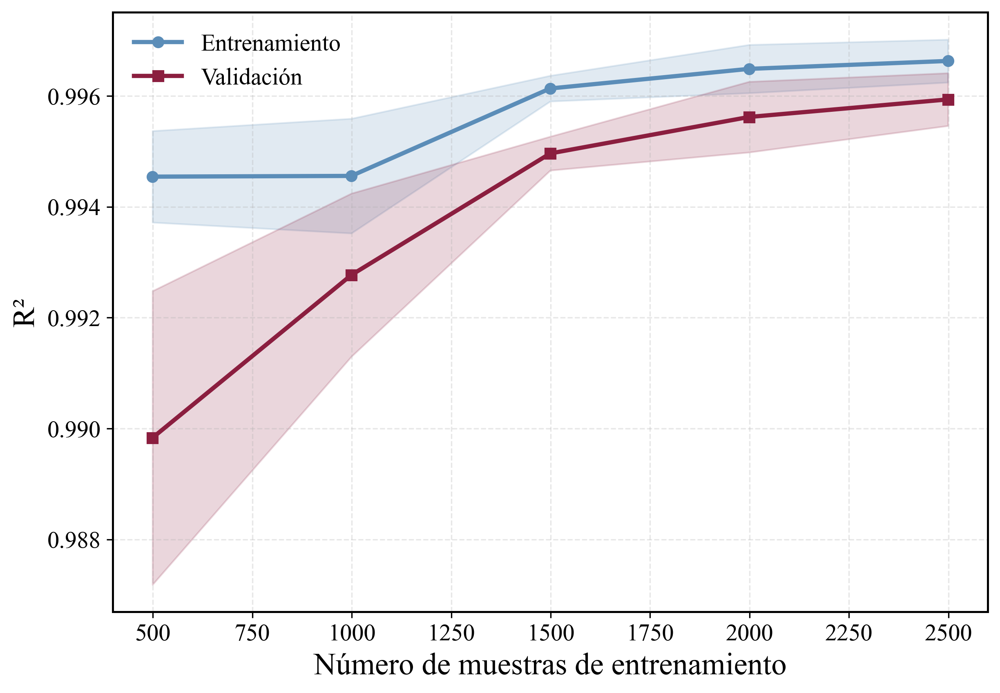

In [6]:
# ============================
# 10. Curva de entrenamiento y validación
# ============================
train_sizes, train_scores, val_scores = learning_curve(
    best_mlp,
    X_train,
    y_train,
    cv=kfold,
    scoring='r2',
    train_sizes=np.linspace(0.2, 1.0, 5),
    n_jobs=-1
)

train_mean = train_scores.mean(axis=1)
train_std = train_scores.std(axis=1)

val_mean = val_scores.mean(axis=1)
val_std = val_scores.std(axis=1)

plt.figure(figsize=(8.5, 6), dpi=300)

plt.plot(
    train_sizes,
    train_mean,
    marker='o',
    linewidth=2.5,
    color='#5B8DB8',
    label='Entrenamiento'
)

plt.fill_between(
    train_sizes,
    train_mean - train_std,
    train_mean + train_std,
    color='#5B8DB8',
    alpha=0.18
)

plt.plot(
    train_sizes,
    val_mean,
    marker='s',
    linewidth=2.5,
    color='#8B1E3F',
    label='Validación'
)

plt.fill_between(
    train_sizes,
    val_mean - val_std,
    val_mean + val_std,
    color='#8B1E3F',
    alpha=0.18
)

plt.xlabel('Número de muestras de entrenamiento')
plt.ylabel('R²')
plt.grid(True, linestyle='--', alpha=0.30)
plt.legend(frameon=False, fontsize=14)

plt.tight_layout()
plt.savefig('curva_entrenamiento_validacion_ANN_MLP_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('curva_entrenamiento_validacion_ANN_MLP_X50.png', dpi=800, bbox_inches='tight')
plt.show()

### Extra Trees

In [7]:
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ============================================================
# 1. Variables predictoras y variable objetivo
# ============================================================

X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores faltantes
data = pd.concat([X, y], axis=1).dropna()

X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

print("Tamaño de la base:", data.shape)

# ============================================================
# 2. División entrenamiento / prueba
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================================================
# 3. Modelo Extra Trees
# ============================================================

et = ExtraTreesRegressor(
    random_state=42,
    n_jobs=-1
)

# Grilla rápida para clase
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2],
    'max_features': ['sqrt', None],
    'criterion': ['squared_error']
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    estimator=et,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train, y_train)

best_et = grid.best_estimator_

print("Mejores hiperparámetros Extra Trees:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Tamaño de la base: (4464, 8)
Mejores hiperparámetros Extra Trees:
{'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}

Mejor R² promedio en validación cruzada:
0.993


In [8]:
# ============================================================
# 4. Validación cruzada K-Fold 5
# ============================================================

scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_et,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold_et = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5 - Extra Trees:")
print(tabla_kfold_et.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold_et[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5 - Extra Trees:
   Fold     R²    MAE   RMSE
0     1  0.992  0.547  1.026
1     2  0.995  0.499  0.788
2     3  0.995  0.533  0.780
3     4  0.990  0.578  1.158
4     5  0.992  0.577  1.034

Promedio K-Fold:
R²      0.993
MAE     0.547
RMSE    0.957
dtype: float64


In [9]:
# ============================================================
# 5. Predicciones
# ============================================================

y_train_pred_et = best_et.predict(X_train)
y_test_pred_et = best_et.predict(X_test)

# ============================================================
# 6. Función de evaluación
# ============================================================

def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

evaluar(y_train, y_train_pred_et, "Entrenamiento")
evaluar(y_test, y_test_pred_et, "Prueba")


Entrenamiento:
MAE:  0.000
MSE:  0.000
RMSE: 0.000
R²:   1.000

Prueba:
MAE:  0.531
MSE:  0.794
RMSE: 0.891
R²:   0.994


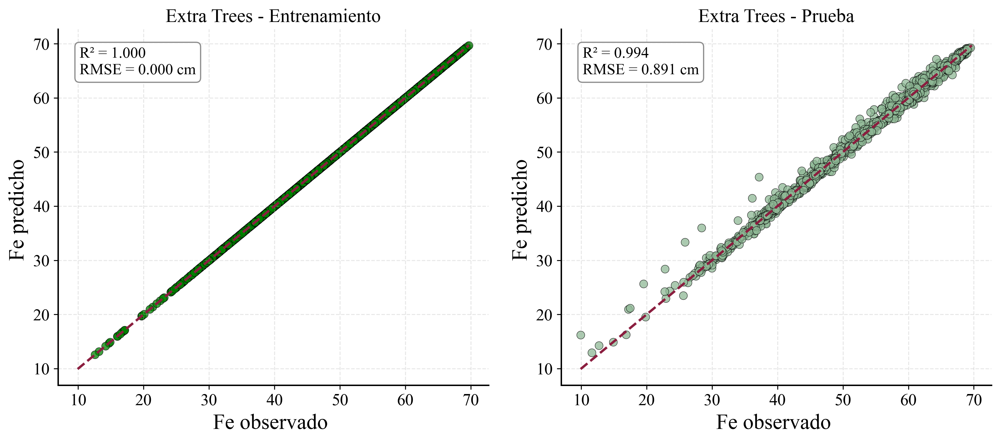

In [11]:
# ============================================================
# 7. Figura: X50 observado vs X50 predicho
# ============================================================

r2_train = r2_score(y_train, y_train_pred_et)
r2_test = r2_score(y_test, y_test_pred_et)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_et))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_et))

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

# Rango común para ambos gráficos
min_val = min(y.min(), y_train_pred_et.min(), y_test_pred_et.min())
max_val = max(y.max(), y_train_pred_et.max(), y_test_pred_et.max())

# ------------------------------------------------------------
# Entrenamiento
# ------------------------------------------------------------

axes[0].scatter(
    y_train,
    y_train_pred_et,
    alpha=0.75,
    color='green',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('Extra Trees - Entrenamiento', fontsize=16)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f} cm',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(
        boxstyle='round,pad=0.3',
        facecolor='white',
        edgecolor='gray',
        alpha=0.9
    )
)

axes[0].grid(True, linestyle='--', alpha=0.30)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ------------------------------------------------------------
# Prueba
# ------------------------------------------------------------

axes[1].scatter(
    y_test,
    y_test_pred_et,
    alpha=0.75,
    color='#8FB996',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('Extra Trees - Prueba', fontsize=16)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f} cm',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(
        boxstyle='round,pad=0.3',
        facecolor='white',
        edgecolor='gray',
        alpha=0.9
    )
)

axes[1].grid(True, linestyle='--', alpha=0.30)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('extra_trees_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('extra_trees_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()


Importancia de variables - Extra Trees:
  Variable  Importancia
3       Si        0.925
2        Z        0.024
5       Al        0.022
6       Mn        0.019
4        P        0.007
0        X        0.002
1        Y        0.002


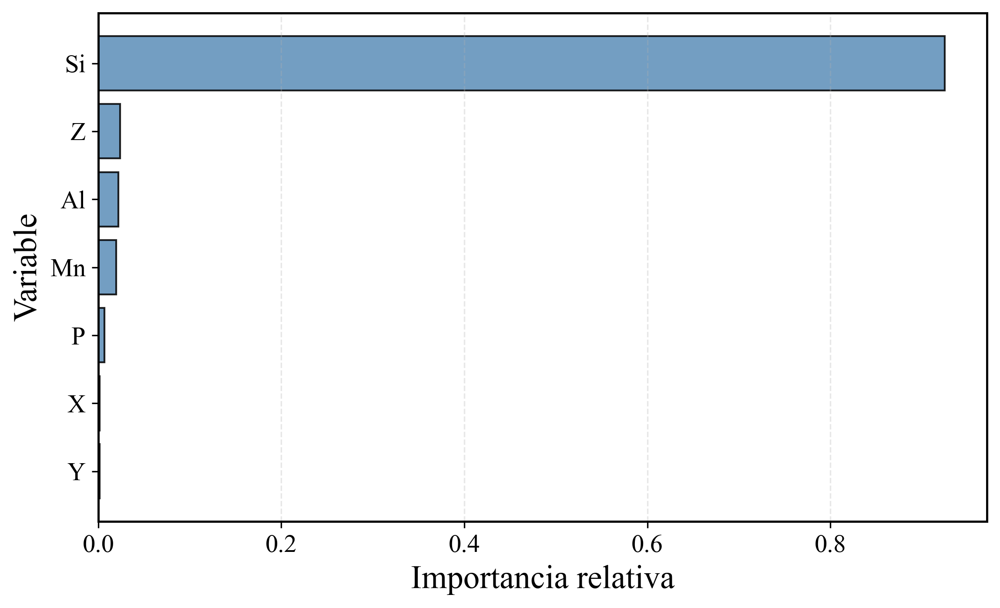

In [12]:
# ============================================================
# 8. Importancia de variables
# ============================================================

importancias_et = pd.DataFrame({
    'Variable': X.columns,
    'Importancia': best_et.feature_importances_
}).sort_values('Importancia', ascending=False)

print("\nImportancia de variables - Extra Trees:")
print(importancias_et.round(3))
# ============================================================
# 9. Gráfico de importancia de variables
# ============================================================

plt.figure(figsize=(8, 5), dpi=300)

plt.barh(
    importancias_et['Variable'],
    importancias_et['Importancia'],
    color='#5B8DB8',
    edgecolor='black',
    alpha=0.85
)

plt.gca().invert_yaxis()

plt.xlabel('Importancia relativa')
plt.ylabel('Variable')

plt.grid(True, axis='x', linestyle='--', alpha=0.30)

plt.tight_layout()
plt.savefig('importancia_variables_ExtraTrees_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('importancia_variables_ExtraTrees_X50.png', dpi=800, bbox_inches='tight')
plt.show()

### LightGBM 

In [13]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings

warnings.filterwarnings("ignore")

# ============================================================
# 1. Variables predictoras y variable objetivo
# ============================================================

X = jmq[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = jmq['Fe']

# Eliminar valores faltantes
data = pd.concat([X, y], axis=1).dropna()

X = data[['X', 'Y', 'Z', 'Si', 'P', 'Al', 'Mn']]
y = data['Fe']

print("Tamaño de la base:", data.shape)

# ============================================================
# 2. División entrenamiento / prueba
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.30,
    random_state=42
)

# ============================================================
# 3. Modelo LightGBM
# ============================================================

lgbm = LGBMRegressor(
    objective='regression',
    random_state=42,
    n_jobs=-1,
    verbose=-1
)

# Grilla rápida para clase
param_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.10],
    'max_depth': [3, 5, -1],
    'num_leaves': [15, 31],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

kfold = KFold(
    n_splits=5,
    shuffle=True,
    random_state=42
)

grid = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    cv=kfold,
    scoring='r2',
    n_jobs=-1
)

grid.fit(X_train, y_train)

best_lgbm = grid.best_estimator_

print("Mejores hiperparámetros LightGBM:")
print(grid.best_params_)

print("\nMejor R² promedio en validación cruzada:")
print(round(grid.best_score_, 3))

Tamaño de la base: (4464, 8)
Mejores hiperparámetros LightGBM:
{'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': -1, 'n_estimators': 200, 'num_leaves': 15, 'subsample': 0.8}

Mejor R² promedio en validación cruzada:
0.991


In [14]:
# ============================================================
# 4. Validación cruzada K-Fold 5
# ============================================================

scoring = {
    'R2': 'r2',
    'MAE': 'neg_mean_absolute_error',
    'MSE': 'neg_mean_squared_error'
}

cv = cross_validate(
    best_lgbm,
    X_train,
    y_train,
    cv=kfold,
    scoring=scoring,
    n_jobs=-1
)

tabla_kfold_lgbm = pd.DataFrame({
    'Fold': [1, 2, 3, 4, 5],
    'R²': cv['test_R2'],
    'MAE': -cv['test_MAE'],
    'RMSE': np.sqrt(-cv['test_MSE'])
})

print("\nTabla K-Fold 5 - LightGBM:")
print(tabla_kfold_lgbm.round(3))

print("\nPromedio K-Fold:")
print(tabla_kfold_lgbm[['R²', 'MAE', 'RMSE']].mean().round(3))


Tabla K-Fold 5 - LightGBM:
   Fold     R²    MAE   RMSE
0     1  0.992  0.599  1.051
1     2  0.995  0.557  0.790
2     3  0.993  0.607  0.909
3     4  0.988  0.635  1.263
4     5  0.988  0.662  1.272

Promedio K-Fold:
R²      0.991
MAE     0.612
RMSE    1.057
dtype: float64


In [15]:
# ============================================================
# 5. Predicciones
# ============================================================

y_train_pred_lgbm = best_lgbm.predict(X_train)
y_test_pred_lgbm = best_lgbm.predict(X_test)

# ============================================================
# 6. Función de evaluación
# ============================================================

def evaluar(y_true, y_pred, conjunto):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)

    print(f"\n{conjunto}:")
    print(f"MAE:  {mae:.3f}")
    print(f"MSE:  {mse:.3f}")
    print(f"RMSE: {rmse:.3f}")
    print(f"R²:   {r2:.3f}")

evaluar(y_train, y_train_pred_lgbm, "Entrenamiento")
evaluar(y_test, y_test_pred_lgbm, "Prueba")


Entrenamiento:
MAE:  0.393
MSE:  0.384
RMSE: 0.620
R²:   0.997

Prueba:
MAE:  0.591
MSE:  0.878
RMSE: 0.937
R²:   0.994


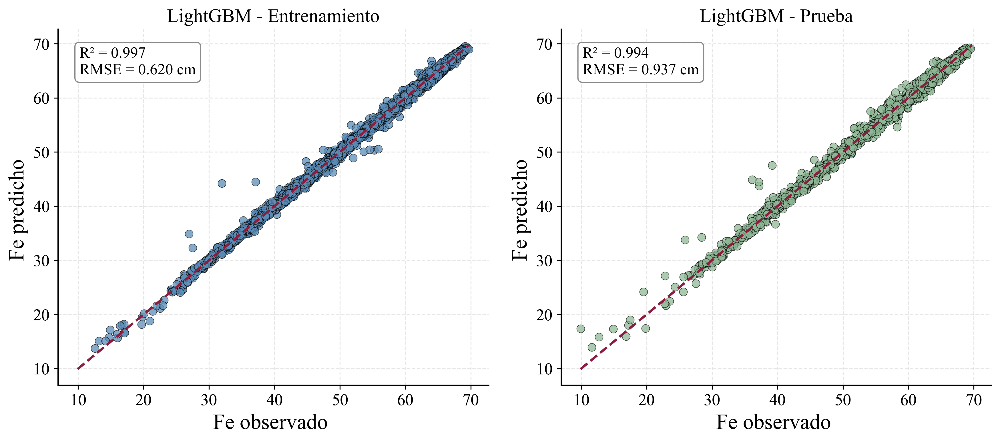

In [16]:
# ============================================================
# 7. Figura: X50 observado vs X50 predicho
# ============================================================

r2_train = r2_score(y_train, y_train_pred_lgbm)
r2_test = r2_score(y_test, y_test_pred_lgbm)

rmse_train = np.sqrt(mean_squared_error(y_train, y_train_pred_lgbm))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_lgbm))

plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman'],
    'font.size': 18,
    'axes.labelsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'axes.linewidth': 1.2
})

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)

# Rango común para ambos gráficos
min_val = min(y.min(), y_train_pred_lgbm.min(), y_test_pred_lgbm.min())
max_val = max(y.max(), y_train_pred_lgbm.max(), y_test_pred_lgbm.max())

# ------------------------------------------------------------
# Entrenamiento
# ------------------------------------------------------------

axes[0].scatter(
    y_train,
    y_train_pred_lgbm,
    alpha=0.75,
    color='#5B8DB8',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[0].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[0].set_xlabel('Fe observado ')
axes[0].set_ylabel('Fe predicho ')
axes[0].set_title('LightGBM - Entrenamiento', fontsize=16)

axes[0].text(
    0.05, 0.95,
    f'R² = {r2_train:.3f}\nRMSE = {rmse_train:.3f} cm',
    transform=axes[0].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(
        boxstyle='round,pad=0.3',
        facecolor='white',
        edgecolor='gray',
        alpha=0.9
    )
)

axes[0].grid(True, linestyle='--', alpha=0.30)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ------------------------------------------------------------
# Prueba
# ------------------------------------------------------------

axes[1].scatter(
    y_test,
    y_test_pred_lgbm,
    alpha=0.75,
    color='#8FB996',
    edgecolor='black',
    linewidth=0.4,
    s=45
)

axes[1].plot(
    [min_val, max_val],
    [min_val, max_val],
    '--',
    color='#8B1E3F',
    linewidth=2
)

axes[1].set_xlabel('Fe observado ')
axes[1].set_ylabel('Fe predicho ')
axes[1].set_title('LightGBM - Prueba', fontsize=16)

axes[1].text(
    0.05, 0.95,
    f'R² = {r2_test:.3f}\nRMSE = {rmse_test:.3f} cm',
    transform=axes[1].transAxes,
    ha='left',
    va='top',
    fontsize=13,
    bbox=dict(
        boxstyle='round,pad=0.3',
        facecolor='white',
        edgecolor='gray',
        alpha=0.9
    )
)

axes[1].grid(True, linestyle='--', alpha=0.30)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

plt.tight_layout()
plt.savefig('lightgbm_entrenamiento_prueba_Fe.png', dpi=800, bbox_inches='tight')
#plt.savefig('lightgbm_entrenamiento_prueba_X50.png', dpi=800, bbox_inches='tight')
plt.show()

#### GRACIAS